In [62]:
import numpy as np 
import pandas as pd
import os
import random
import glob
import cv2
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tensorflow.keras.layers import *
from tensorflow.keras import Model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
from tqdm import tqdm_notebook
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
import tensorflow_model_optimization as tfmot

In [63]:
#!pip install tensorflow_model_optimization

#### CHANNELS variable: controls if you want the images to be grayscale(CHANNELS = 1) or RGB (CHANNELS = 3) 
#### modelsel: if it is 1: first model with upsampling
#### if it is 2: first model with upsampling and hyperparameter optimizarion
#### if it is 3: third model with deconc

In [64]:
modelsel = 1
EPOCHS=30
BATCH_SIZE=16
HEIGHT=256
WIDTH=256
CHANNELS=3
N_CLASSES=13
FILTERS=32
AUTO = tf.data.AUTOTUNE

# Utility functions

In [65]:
from PIL import Image, ImageOps

def loadImage(path):
    if CHANNELS==3:
#         img = Image.open(path)
#         img = np.array(img)
        img = cv2.imread(path)
        image = img[:,:256]
        image = image / 255.0
        mask = img[:,256:]
    else:
        img = cv2.imread(path,0)
        image = img[:,:256]
        image = image / 255.0
        mask = img[:,256:]
    return image, mask

def bin_image(mask):
    bins = np.array([20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240])
    new_mask = np.digitize(mask, bins)
    return new_mask

def getSegmentationArr(image, classes, width=WIDTH, height=HEIGHT):
    seg_labels = np.zeros((height, width, classes))
    if CHANNELS==3:
        img = image[:, : , 0]
    else:
        img = image[:, :]
        
    for c in range(classes):
        seg_labels[:, :, c] = (img == c ).astype(int)
    return seg_labels

def give_color_to_seg_img(seg, n_classes=N_CLASSES):
    
    seg_img = np.zeros( (seg.shape[0],seg.shape[1],3) ).astype('float')
    colors = sns.color_palette("hls", n_classes)
    
    for c in range(n_classes):
        segc = (seg == c)
        seg_img[:,:,0] += (segc*( colors[c][0] ))
        seg_img[:,:,1] += (segc*( colors[c][1] ))
        seg_img[:,:,2] += (segc*( colors[c][2] ))

    return(seg_img)

In [66]:
train_folder = "segdata/cityscapes_data/cityscapes_data/train"
valid_folder = "segdata/cityscapes_data/cityscapes_data/val"
train_filenames = glob.glob(os.path.join(train_folder, "*.jpg"))
valid_filenames = glob.glob(os.path.join(valid_folder, "*.jpg"))

num_of_training_samples = len(train_filenames) 
num_of_valid_samples = len(valid_filenames)

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, filenames,
                 batch_size=BATCH_SIZE,
                 shuffle=True):

        self.filenames = filenames
        self.batch_size = BATCH_SIZE
        self.shuffle= shuffle
        self.n = len(self.filenames)

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)

    def __get_data(self, batches):
        imgs=[]
        segs=[]
        for file in batches:
            image, mask = loadImage(file)
            mask_binned = bin_image(mask)
            labels = getSegmentationArr(mask_binned, N_CLASSES)
#             labels = np.argmax(labels, axis=-1)

            imgs.append(image)
            segs.append(labels)

        return np.array(imgs), np.array(segs)

    def __getitem__(self, index):

        batches = self.filenames[index * self.batch_size:(index + 1) * self.batch_size]

        X, y = self.__get_data(batches)

        return (X, y)

    def __len__(self):

        return self.n // self.batch_size

In [67]:
train_gen = DataGenerator(train_filenames)
val_gen = DataGenerator(valid_filenames)

In [119]:
len(train_gen)

185

In [120]:
len(val_gen)

31

In [68]:
train_gen[0]

(array([[[[0.79215686, 0.81176471, 0.70588235],
          [0.78039216, 0.8       , 0.69411765],
          [0.57254902, 0.59215686, 0.48627451],
          ...,
          [0.12941176, 0.16862745, 0.10588235],
          [0.15686275, 0.20392157, 0.13333333],
          [0.12941176, 0.15686275, 0.09803922]],
 
         [[0.78823529, 0.80784314, 0.70196078],
          [0.78039216, 0.8       , 0.69411765],
          [0.57254902, 0.59215686, 0.48627451],
          ...,
          [0.23529412, 0.2745098 , 0.21176471],
          [0.1254902 , 0.17254902, 0.10196078],
          [0.22352941, 0.24705882, 0.18039216]],
 
         [[0.78823529, 0.80392157, 0.69019608],
          [0.78431373, 0.8       , 0.68627451],
          [0.58039216, 0.59607843, 0.48235294],
          ...,
          [0.15294118, 0.19215686, 0.12941176],
          [0.10196078, 0.14901961, 0.07843137],
          [0.2       , 0.21960784, 0.1372549 ]],
 
         ...,
 
         [[0.32941176, 0.40392157, 0.32941176],
          [0.32941

In [69]:
for imgs, segs in train_gen:
    break
imgs.shape, segs.shape

((16, 256, 256, 3), (16, 256, 256, 13))

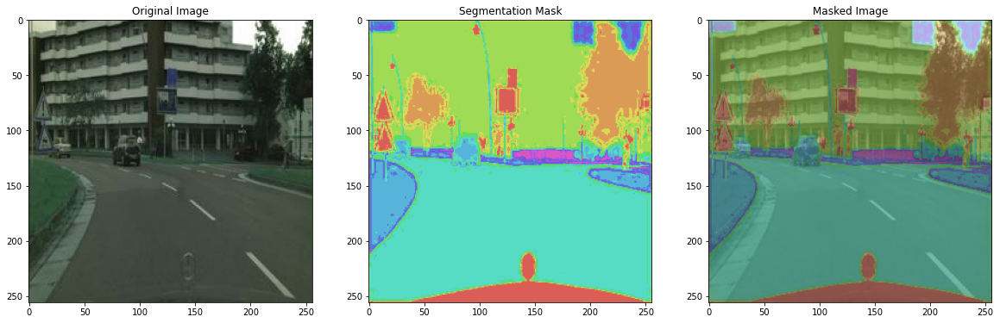

In [70]:
image = imgs[0]
mask = np.argmax(segs[0], axis=-1)
mask = give_color_to_seg_img(mask)
if CHANNELS == 3:
    masked_image = image * 0.5 + mask * 0.5
else:
#     mask= rgb2gray(mask)
    masked_image = image * 0.5 + mask[:,:,0] * 0.5

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[1].imshow(mask)
axs[1].set_title('Segmentation Mask')
#predimg = cv2.addWeighted(imgs[i]/255, 0.6, _p, 0.4, 0)
axs[2].imshow(masked_image)
axs[2].set_title('Masked Image')
plt.show()

# Loss Function

In [71]:
smooth = 1

def dice_coef(y_true, y_pred):
    And = tf.reduce_sum(y_true * y_pred)
    return (2 * And + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    sum_ = tf.reduce_sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    return 1 - iou(y_true, y_pred)

# First Model using Upsampling

In [72]:
def unet():
    main_input = Input(shape=(HEIGHT, WIDTH, CHANNELS), name = 'img_input')

    ''' ~~~~~~~~~~~~~~~~~~~ ENCODING LAYERS ~~~~~~~~~~~~~~~~~~~ '''

    c1 = Conv2D(FILTERS, kernel_size=(3,3), padding = 'same')(main_input)
    c1 = LeakyReLU(0.2)(c1)
    c1 = BatchNormalization()(c1)
    c1 = Conv2D(FILTERS, kernel_size=(3,3), padding = 'same')(c1)
    c1 = LeakyReLU(0.2)(c1)
    c1 = BatchNormalization()(c1)

    p1 = MaxPooling2D((2,2))(c1)

    c2 = Conv2D(FILTERS*2, kernel_size=(3,3), padding = 'same')(p1)
    c2 = LeakyReLU(0.2)(c2)
    c2 = BatchNormalization()(c2)
    c2 = Conv2D(FILTERS*2, kernel_size=(3,3), padding = 'same')(c2)
    c2 = LeakyReLU(0.2)(c2)
    c2 = BatchNormalization()(c2)

    p2 = MaxPooling2D((2,2))(c2)

    c3 = Conv2D(FILTERS*4, kernel_size=(3,3), padding = 'same')(p2)
    c3 = LeakyReLU(0.2)(c3)
    c3 = BatchNormalization()(c3)
    c3 = Conv2D(FILTERS*2, kernel_size=(1,1), padding = 'same')(c3)
    c3 = LeakyReLU(0.2)(c3)
    c3 = BatchNormalization()(c3)
    c3 = Conv2D(FILTERS*4, kernel_size=(3,3), padding = 'same')(c3)
    c3 = LeakyReLU(0.2)(c3)
    c3 = BatchNormalization()(c3)

    p3 = MaxPooling2D((2,2))(c3)

    c4 = Conv2D(FILTERS*6, kernel_size=(3,3), padding = 'same')(p3)
    c4 = LeakyReLU(0.2)(c4)
    c4 = BatchNormalization()(c4)
    c4 = Conv2D(FILTERS*4, kernel_size=(1,1), padding = 'same')(c4)
    c4 = LeakyReLU(0.2)(c4)
    c4 = BatchNormalization()(c4)
    c4 = Conv2D(FILTERS*6, kernel_size=(3,3), padding = 'same')(c4)
    c4 = LeakyReLU(0.2)(c4)
    c4 = BatchNormalization()(c4)

    p4 = MaxPooling2D((2,2))(c4)

    c5 = Conv2D(FILTERS*6, kernel_size=(3,3), padding = 'same')(p4)
    c5 = LeakyReLU(0.2)(c5)
    c5 = BatchNormalization()(c5)


    ''' ~~~~~~~~~~~~~~~~~~~ DECODING LAYERS ~~~~~~~~~~~~~~~~~~~ '''

    u1 = UpSampling2D((2,2))(c5)
    concat1 = concatenate([c4, u1])

    c6 = Conv2D(FILTERS*4, kernel_size=(3,3), padding = 'same')(concat1)
    c6 = LeakyReLU(0.2)(c6)
    c6 = BatchNormalization()(c6)
    c6 = Conv2D(FILTERS*4, kernel_size=(3,3), padding = 'same')(c6)
    c6 = LeakyReLU(0.2)(c6)
    c6 = BatchNormalization()(c6)


    u2 = UpSampling2D((2,2))(c6)
    concat2 = concatenate([c3, u2])

    c7 = Conv2D(FILTERS*2, kernel_size=(3,3), padding = 'same')(concat2)
    c7 = LeakyReLU(0.2)(c7)
    c7 = BatchNormalization()(c7)
    c7 = Conv2D(FILTERS*2, kernel_size=(3,3), padding = 'same')(c7)
    c7 = LeakyReLU(0.2)(c7)
    c7 = BatchNormalization()(c7)

    u3 = UpSampling2D((2,2))(c7)
    concat3 = concatenate([c2, u3])

    c8 = Conv2D(FILTERS, kernel_size=(3,3), padding = 'same')(concat3)
    c8 = LeakyReLU(0.2)(c8)
    c8 = BatchNormalization()(c8)
    c8 = Conv2D(FILTERS, kernel_size=(3,3), padding = 'same')(c8)
    c8 = LeakyReLU(0.2)(c8)
    c8 = BatchNormalization()(c8)

    u4 = UpSampling2D((2,2))(c8)
    concat4 = concatenate([c1, u4])

    c9 = Conv2D(FILTERS * 0.5, kernel_size = (1,1), padding = 'same')(concat4)
    c9 = LeakyReLU(0.2)(c9)
    c9 = BatchNormalization()(c9)

    mask_out = Conv2D(N_CLASSES, (1,1), padding = 'same', activation = 'sigmoid', name = 'mask_out')(c9)

    model = Model(inputs = [main_input], outputs = [mask_out])
    
    return model

# Third Model with Deconv

In [73]:
def conv_block(tensor, nfilters, size=3, padding='same', initializer="he_normal"):
    x = Conv2D(filters=nfilters, kernel_size=(size, size), padding=padding, kernel_initializer=initializer)(tensor)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(filters=nfilters, kernel_size=(size, size), padding=padding, kernel_initializer=initializer)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x


def deconv_block(tensor, residual, nfilters, size=3, padding='same', strides=(2, 2)):
    y = Conv2DTranspose(nfilters, kernel_size=(size, size), strides=strides, padding=padding)(tensor)
    y = concatenate([y, residual], axis=3)
    y = conv_block(y, nfilters)
    return y


def Unet(h, w, filters):
# down
    input_layer = Input(shape=(h, w, CHANNELS), name='image_input')#adjust this to 1 or Three
    conv1 = conv_block(input_layer, nfilters=filters)
    conv1_out = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = conv_block(conv1_out, nfilters=filters*2)
    conv2_out = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = conv_block(conv2_out, nfilters=filters*4)
    conv3_out = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = conv_block(conv3_out, nfilters=filters*8)
    conv4_out = MaxPooling2D(pool_size=(2, 2))(conv4)
    conv4_out = Dropout(0.5)(conv4_out)
    conv5 = conv_block(conv4_out, nfilters=filters*16)
    conv5 = Dropout(0.5)(conv5)
# up
    deconv6 = deconv_block(conv5, residual=conv4, nfilters=filters*8)
    deconv6 = Dropout(0.5)(deconv6)
    deconv7 = deconv_block(deconv6, residual=conv3, nfilters=filters*4)
    deconv7 = Dropout(0.5)(deconv7) 
    deconv8 = deconv_block(deconv7, residual=conv2, nfilters=filters*2)
    deconv9 = deconv_block(deconv8, residual=conv1, nfilters=filters)
    output_layer = Conv2D(filters=13, kernel_size=(1, 1), activation='softmax')(deconv9)#it was 32 but had to swap to 13

    model = Model(inputs=input_layer, outputs=output_layer, name='Unet')
    return model

# Pruining


In [74]:
import tensorflow_model_optimization as tfmot
def get_pruned(model):
    prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

    # Compute end step to finish pruning after 2 epochs.

    # batch_size = EPOCHS
    # epochs = 10
    validation_split = 0.1 # 10% of training set will be used for validation set. 

    num_images = num_of_training_samples  * (1 - validation_split)
    end_step = np.ceil(num_images / BATCH_SIZE).astype(np.int32) * EPOCHS

    # Define model for pruning.
    pruning_params = {
          'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=0.25,
                                                                   final_sparsity=0.85,
                                                                   begin_step=0,
                                                                   end_step=end_step)
    }

    model_for_pruning1 = prune_low_magnitude(model, **pruning_params)

    # `prune_low_magnitude` requires a recompile.
    model_for_pruning1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # model_for_pruning.summary()




    import tempfile
    logdir = tempfile.mkdtemp()

    callbacks = [
      tfmot.sparsity.keras.UpdatePruningStep(),
      tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
    ]

    model_for_pruning1.fit_generator(train_gen,
                      epochs=EPOCHS, validation_data=val_gen,
                      callbacks=callbacks)
    
    return model_for_pruning1

In [75]:
import tempfile
logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

In [76]:
def strip_pruning(model):
    model_for_export = tfmot.sparsity.keras.strip_pruning(model)
    model_for_export.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy',tf.keras.metrics.MeanIoU(num_classes=N_CLASSES)])
    model_for_export.fit_generator(train_gen,
                  epochs=EPOCHS, validation_data=val_gen,
                  callbacks=callbacks)
    saving_pruned(model_for_export)
    return model_for_export
    

# Callbacks

In [77]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger, TensorBoard

mc = ModelCheckpoint(mode='max', filepath='top-weights.h5', monitor='val_accuracy',save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=10, verbose=0)
tb = TensorBoard(log_dir="logs/", histogram_freq=0, write_graph=True, write_images=False)
rl = ReduceLROnPlateau(monitor='val_accuracy',factor=0.1,patience=5,verbose=1,mode="max",min_lr=0.0001)
cv = CSVLogger("logs/log.csv" , append=True , separator=',')


In [99]:
def create_model(modelsel):
    if modelsel == 1:
        model = unet()
        model.summary()
        TRAIN_STEPS = len(train_gen)
        VAL_STEPS = len(val_gen)
        model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=["accuracy",tf.keras.metrics.MeanIoU(num_classes=N_CLASSES)])
        history = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=TRAIN_STEPS, 
                             validation_steps=VAL_STEPS, epochs=EPOCHS, callbacks =[mc,es,tb,rl,cv] )

    elif modelsel == 2:
        TRAIN_STEPS = len(train_gen)
        VAL_STEPS = len(val_gen)
        model = unet()
        learning_rate = 1e-4
        decay_rate = (learning_rate - 1e-6) / 100
        opt = tf.keras.optimizers.Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, decay=decay_rate, amsgrad=False)
        checkpoint = ModelCheckpoint('seg_model_v2.h5', monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=True)
        model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=["accuracy",tf.keras.metrics.MeanIoU(num_classes=N_CLASSES)])
        history2 = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=TRAIN_STEPS, 
                              validation_steps=VAL_STEPS, epochs=EPOCHS, callbacks =[mc,es,tb,rl,cv])
    elif modelsel == 3:
        TRAIN_STEPS = len(train_gen)
        VAL_STEPS = len(val_gen)
        model = Unet(HEIGHT ,WIDTH, FILTERS)
        model.summary()
        model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=["accuracy",tf.keras.metrics.MeanIoU(num_classes=N_CLASSES)])
        history = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=TRAIN_STEPS, 
                             validation_steps=VAL_STEPS, epochs=EPOCHS,callbacks =[mc,es,tb,rl,cv])

    return model


In [79]:
def saving_orig(model):
    if modelsel== 1 and CHANNELS == 3 :
        model.save("1seg-upsam-model-color-batch16.h5")
        print("Saved model to disk")
    elif modelsel== 1 and CHANNELS == 1 :
        model.save("1seg-upsam-model-gray-batch16.h5")
        print("Saved model to disk")
    elif modelsel== 2 and CHANNELS == 3 :
        model.save("2seg-upsam-model-color-batch16-withlr.h5")
        print("Saved model to disk")
    elif modelsel== 2 and CHANNELS == 1 :
        model.save("2seg-upsam-model-gray-batch16-withlr.h5")
        print("Saved model to disk")
    elif modelsel== 3 and CHANNELS == 3 :
        model.save("3seg-deconv-color-batch16.h5")
        print("Saved model to disk")
    elif modelsel== 3 and CHANNELS == 1 :
        model.save("3seg-deconv-gray-batch16.h5")
        print("Saved model to disk")
    

In [80]:
def saving_pruned(model):
    if modelsel== 1 and CHANNELS == 3 :
        model.save("1seg-onlypruined-upsa-color-batch16.h5")
        print("Saved model to disk")
    elif modelsel== 1 and CHANNELS == 1 :
        model.save("1seg-onlypruined-upsa-gray-batch16.h5")
        print("Saved model to disk")
    elif modelsel== 2 and CHANNELS == 3 :
        model.save("2seg-onlypruined-upsa-color-batch16-withlr.h5")
        print("Saved model to disk")
    elif modelsel== 2 and CHANNELS == 1 :
        model.save("2seg-onlypruined-upsa-gray-batch16-withlr.h5")
        print("Saved model to disk")
    elif modelsel== 3 and CHANNELS == 3 :
        model.save("3seg-onlypruined-deconv-color-batch16.h5")
        print("Saved model to disk")
    elif modelsel== 3 and CHANNELS == 1 :
        model.save("3seg-onlypruined-deconv-gray-batch16.h5")
        print("Saved model to disk")
    

In [81]:
def load_orig(modelsel):
    if modelsel==1 and CHANNELS == 3:
        model=tf.keras.models.load_model('seg-upsam-model-color-batch16.h5')
    elif modelsel==1 and CHANNELS == 1:
        model=tf.keras.models.load_model('seg-upsam-model-gray-batch16.h5')
    elif modelsel==2 and CHANNELS == 3:
        model=tf.keras.models.load_model('seg-upsam-model-color-batch16-withlr.h5')
    elif modelsel==2 and CHANNELS == 1:
        model=tf.keras.models.load_model('seg-upsam-model-gray-batch16-withlr.h5')
        
    elif modelsel==3 and CHANNELS == 3:
        model=tf.keras.models.load_model('seg-deconv-color-batch16.h5')
    elif modelsel==3 and CHANNELS == 1:
        model=tf.keras.models.load_model('seg-deconv-gray-batch16.h5')
    return model
        

In [82]:
def load_pruned(modelsel):
    if modelsel==1 and CHANNELS == 3:
        model=tf.keras.models.load_model('seg-onlypruined-upsa-color-batch16.h5')
    elif modelsel==1 and CHANNELS == 1:
        model=tf.keras.models.load_model('seg-onlypruined-upsa-gray-batch16.h5')
    elif modelsel==2 and CHANNELS == 3:
        model=tf.keras.models.load_model('seg-onlypruined-upsa-color-batch16-withlr.h5')
    elif modelsel==2 and CHANNELS == 1:
        model=tf.keras.models.load_model('seg-onlypruined-upsa-gray-batch16-withlr.h5')
        
    elif modelsel==3 and CHANNELS == 3:
        model=tf.keras.models.load_model('seg-onlypruined-deconv-color-batch16.h5')
    elif modelsel==3 and CHANNELS == 1:
        model=tf.keras.models.load_model('seg-onlypruined-deconv-gray-batch16.h5')
    return model

In [83]:
def timing_model(model):
    start_time = time.time()
    pred = model.predict(np.expand_dims(imgs[0],axis=0)) #adds 1 to the first dimension, so it will be (1,256,256,3)
    end_time = time.time()
    total_time = end_time - start_time
    print("Time: ", total_time)
    return total_time

# Train History

In [84]:
def get_hist(model):
    loss = history.history["val_loss"]
    acc = model.history["val_accuracy"]
    plt.figure(figsize=(12, 10))
    plt.subplot(211)
    plt.title("Val. cce Loss")
    plt.plot(loss)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.subplot(212)
    plt.title("Val. Accuracy")
    plt.plot(acc)
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.tight_layout()
    plt.show()

# Test Generator

In [85]:
test_gen = DataGenerator(valid_filenames, 1)

In [118]:
len(test_gen)

31

# Visualize outputs

In [86]:
def visualize_model(model):
    test_iter = iter(test_gen)


    for i in range(12):
        imgs, segs = next(test_iter)
        pred = model.predict(imgs)
        _p = give_color_to_seg_img(np.argmax(pred[0], axis=-1))
        _s = give_color_to_seg_img(np.argmax(segs[0], axis=-1))
        image = imgs[0]
        if CHANNELS == 1:
            image = np.repeat(np.expand_dims(imgs[0], axis = -1),3,axis = 2)

        predimg = cv2.addWeighted( image, 0.5, _p, 0.5, 0) 
        trueimg = cv2.addWeighted(image, 0.5, _s, 0.5, 0)

        plt.figure(figsize=(12, 4))
        plt.subplot(131)
        plt.title("Original")
        plt.imshow(image)
        plt.axis("off")

        plt.subplot(132)
        plt.title("Prediction")
        plt.imshow(predimg)
        plt.axis("off")

        plt.subplot(133)
        plt.title("Ground truth")
        plt.imshow(trueimg)
        plt.axis("off")
        plt.tight_layout()
        plt.savefig("pred_"+str(i)+".png", dpi=150)
        plt.show()


In [87]:
#pred.shape

In [88]:
imgs[0].shape

(256, 256, 3)

# calling all of the functions for model 1

In [100]:
modelsel = 1

In [101]:
modeltest = create_model(modelsel)

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_182 (Conv2D)             (None, 256, 256, 32) 896         img_input[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_144 (LeakyReLU)     (None, 256, 256, 32) 0           conv2d_182[0][0]                 
__________________________________________________________________________________________________
batch_normalization_180 (BatchN (None, 256, 256, 32) 128         leaky_re_lu_144[0][0]            
____________________________________________________________________________________________

In [102]:
saving_orig(modeltest)

Saved model to disk


In [103]:
modeltest= get_pruned(modeltest)

Epoch 1/30
185/185 [==============================] - 107s 485ms/step - loss: 0.5852 - accuracy: 0.7984 - val_loss: 0.7938 - val_accuracy: 0.7513
Epoch 2/30
185/185 [==============================] - 72s 389ms/step - loss: 0.5699 - accuracy: 0.8026 - val_loss: 0.7689 - val_accuracy: 0.7594
Epoch 3/30
185/185 [==============================] - 72s 390ms/step - loss: 0.5639 - accuracy: 0.8043 - val_loss: 0.7588 - val_accuracy: 0.7591
Epoch 4/30
185/185 [==============================] - 72s 389ms/step - loss: 0.5586 - accuracy: 0.8057 - val_loss: 0.7771 - val_accuracy: 0.7556
Epoch 5/30
185/185 [==============================] - 74s 398ms/step - loss: 0.5509 - accuracy: 0.8078 - val_loss: 0.8173 - val_accuracy: 0.7459
Epoch 6/30
185/185 [==============================] - 75s 404ms/step - loss: 0.5492 - accuracy: 0.8081 - val_loss: 0.8074 - val_accuracy: 0.7495
Epoch 7/30
185/185 [==============================] - 76s 408ms/step - loss: 0.5431 - accuracy: 0.8098 - val_loss: 0.7803 - val_a

In [104]:
modeltest.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
prune_low_magnitude_conv2d_182  (None, 256, 256, 32) 1762        img_input[0][0]                  
__________________________________________________________________________________________________
prune_low_magnitude_leaky_re_lu (None, 256, 256, 32) 1           prune_low_magnitude_conv2d_182[0]
__________________________________________________________________________________________________
prune_low_magnitude_batch_norma (None, 256, 256, 32) 129         prune_low_magnitude_leaky_re_lu_1
____________________________________________________________________________________________

In [105]:
modeltest2=strip_pruning(modeltest)

Epoch 1/30
185/185 [==============================] - 80s 421ms/step - loss: 0.6106 - accuracy: 0.7911 - mean_io_u_7: 0.4745 - val_loss: 0.8984 - val_accuracy: 0.7290 - val_mean_io_u_7: 0.4889
Epoch 2/30
185/185 [==============================] - 69s 373ms/step - loss: 0.5634 - accuracy: 0.8035 - mean_io_u_7: 0.4733 - val_loss: 0.8222 - val_accuracy: 0.7480 - val_mean_io_u_7: 0.4770
Epoch 3/30
185/185 [==============================] - 68s 367ms/step - loss: 0.5508 - accuracy: 0.8069 - mean_io_u_7: 0.4725 - val_loss: 0.8614 - val_accuracy: 0.7530 - val_mean_io_u_7: 0.4813
Epoch 4/30
185/185 [==============================] - 68s 368ms/step - loss: 0.5404 - accuracy: 0.8098 - mean_io_u_7: 0.4726 - val_loss: 0.8361 - val_accuracy: 0.7419 - val_mean_io_u_7: 0.4741
Epoch 5/30
185/185 [==============================] - 68s 366ms/step - loss: 0.5318 - accuracy: 0.8122 - mean_io_u_7: 0.4722 - val_loss: 0.8085 - val_accuracy: 0.7567 - val_mean_io_u_7: 0.4747
Epoch 6/30
185/185 [===============

In [106]:
modeltest2.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_182 (Conv2D)             (None, 256, 256, 32) 896         img_input[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_144 (LeakyReLU)     (None, 256, 256, 32) 0           conv2d_182[1][0]                 
__________________________________________________________________________________________________
batch_normalization_180 (BatchN (None, 256, 256, 32) 128         leaky_re_lu_144[1][0]            
____________________________________________________________________________________________

In [107]:
saving_pruned(modeltest2)

Saved model to disk


In [121]:
#time for the First stripped and pruned model
timing_model(modeltest2)

Time:  0.8277363777160645


0.8277363777160645

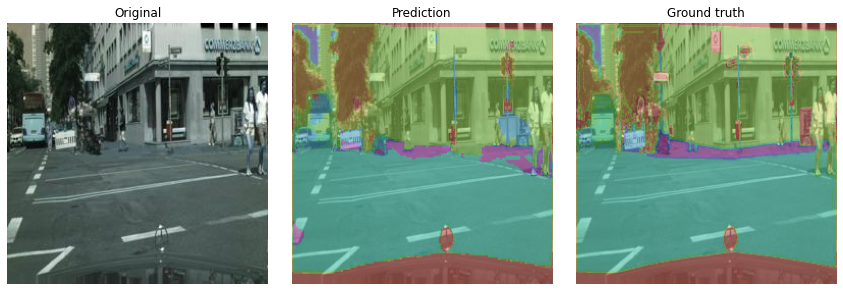

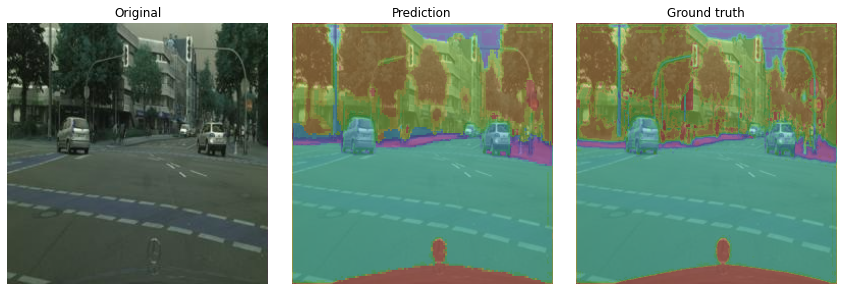

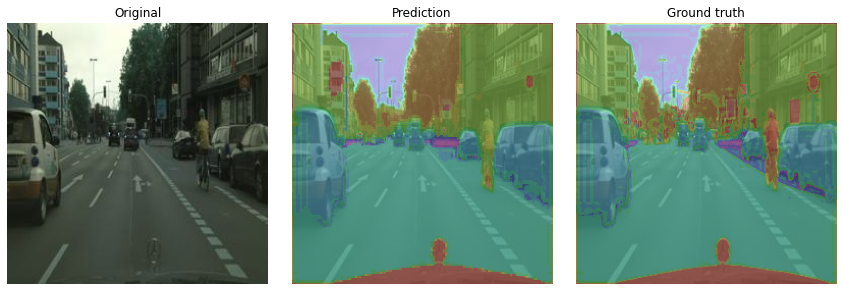

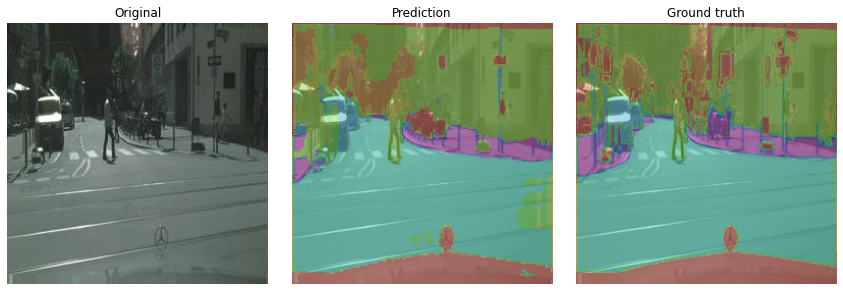

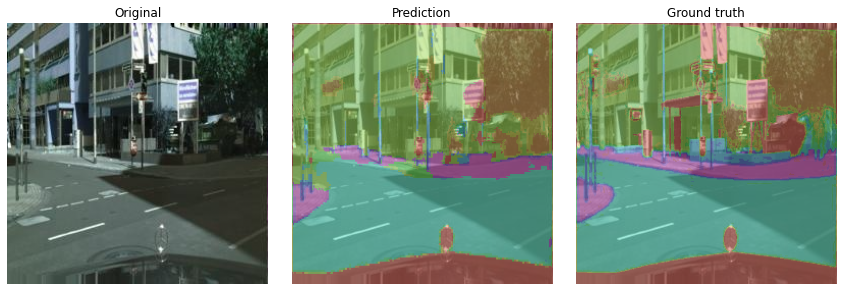

...

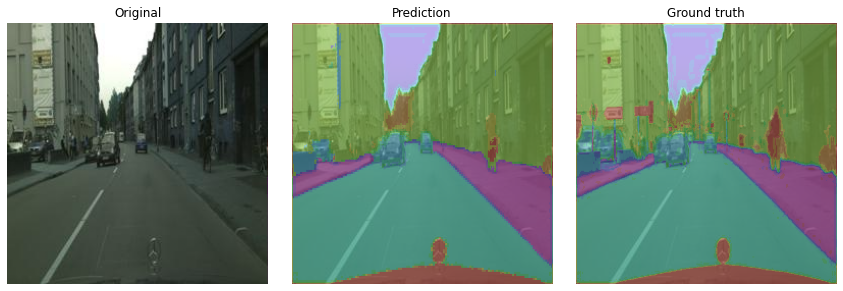

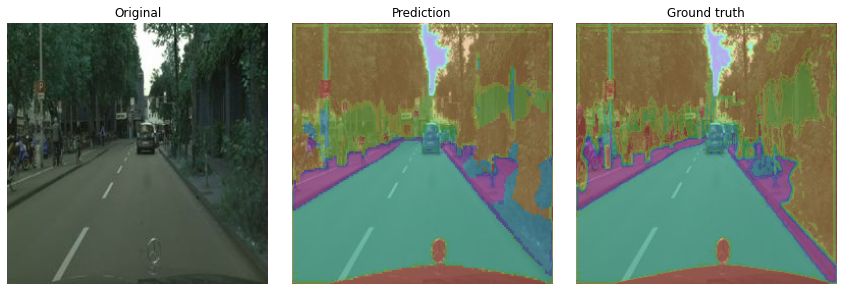

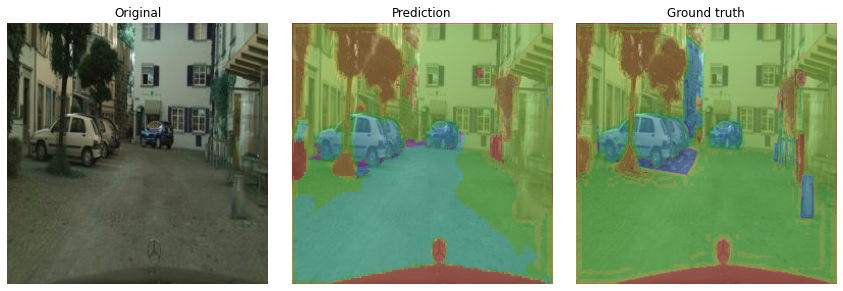

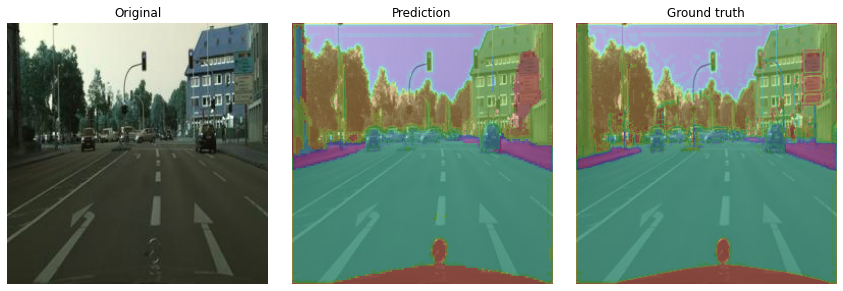

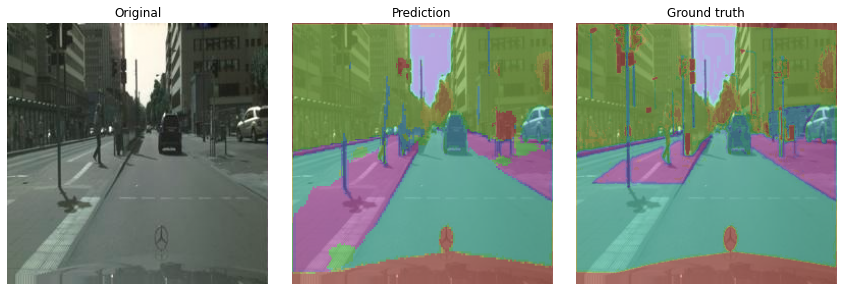

In [136]:
visualize_model(modeltest2)

# calling all of the functions for model 2

In [108]:
modelsel = 2

In [109]:
modeltest3 = create_model(modelsel)

Epoch 1/30
185/185 [==============================] - 76s 399ms/step - loss: 1.5457 - accuracy: 0.5931 - mean_io_u_8: 0.4615 - val_loss: 2.4987 - val_accuracy: 0.3475 - val_mean_io_u_8: 0.4615

Epoch 00001: val_accuracy did not improve from 0.76467
Epoch 2/30
185/185 [==============================] - 68s 366ms/step - loss: 1.2058 - accuracy: 0.6894 - mean_io_u_8: 0.4615 - val_loss: 1.9865 - val_accuracy: 0.4555 - val_mean_io_u_8: 0.4615

Epoch 00002: val_accuracy did not improve from 0.76467
Epoch 3/30
185/185 [==============================] - 68s 366ms/step - loss: 1.0923 - accuracy: 0.7092 - mean_io_u_8: 0.4615 - val_loss: 1.5340 - val_accuracy: 0.5904 - val_mean_io_u_8: 0.4615

Epoch 00003: val_accuracy did not improve from 0.76467
Epoch 4/30
185/185 [==============================] - 68s 367ms/step - loss: 1.0204 - accuracy: 0.7203 - mean_io_u_8: 0.4615 - val_loss: 1.0527 - val_accuracy: 0.7052 - val_mean_io_u_8: 0.4615

Epoch 00004: val_accuracy did not improve from 0.76467
Epoc

In [110]:
saving_orig(modeltest3)

Saved model to disk


In [111]:
modeltest3= get_pruned(modeltest3)

Epoch 1/30
185/185 [==============================] - 97s 445ms/step - loss: 0.9439 - accuracy: 0.7151 - val_loss: 0.9878 - val_accuracy: 0.7055
Epoch 2/30
185/185 [==============================] - 67s 362ms/step - loss: 0.8166 - accuracy: 0.7438 - val_loss: 0.8766 - val_accuracy: 0.7261
Epoch 3/30
185/185 [==============================] - 67s 362ms/step - loss: 0.7800 - accuracy: 0.7522 - val_loss: 0.9039 - val_accuracy: 0.7161
Epoch 4/30
185/185 [==============================] - 67s 364ms/step - loss: 0.7545 - accuracy: 0.7581 - val_loss: 0.8184 - val_accuracy: 0.7368
Epoch 5/30
185/185 [==============================] - 67s 363ms/step - loss: 0.7377 - accuracy: 0.7614 - val_loss: 0.8652 - val_accuracy: 0.7275
Epoch 6/30
185/185 [==============================] - 67s 362ms/step - loss: 0.7203 - accuracy: 0.7656 - val_loss: 1.0420 - val_accuracy: 0.6601
Epoch 7/30
185/185 [==============================] - 67s 362ms/step - loss: 0.6985 - accuracy: 0.7709 - val_loss: 0.8289 - val_ac

In [112]:
modeltest3.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
prune_low_magnitude_conv2d_200  (None, 256, 256, 32) 1762        img_input[0][0]                  
__________________________________________________________________________________________________
prune_low_magnitude_leaky_re_lu (None, 256, 256, 32) 1           prune_low_magnitude_conv2d_200[0]
__________________________________________________________________________________________________
prune_low_magnitude_batch_norma (None, 256, 256, 32) 129         prune_low_magnitude_leaky_re_lu_1
____________________________________________________________________________________________

In [113]:
modeltest4=strip_pruning(modeltest3)

Epoch 1/30
185/185 [==============================] - 73s 384ms/step - loss: 0.7107 - accuracy: 0.7664 - mean_io_u_9: 0.4756 - val_loss: 0.9677 - val_accuracy: 0.7154 - val_mean_io_u_9: 0.4982
Epoch 2/30
185/185 [==============================] - 67s 359ms/step - loss: 0.6582 - accuracy: 0.7791 - mean_io_u_9: 0.4722 - val_loss: 0.8849 - val_accuracy: 0.7280 - val_mean_io_u_9: 0.4936
Epoch 3/30
185/185 [==============================] - 67s 360ms/step - loss: 0.6376 - accuracy: 0.7845 - mean_io_u_9: 0.4691 - val_loss: 0.8945 - val_accuracy: 0.7308 - val_mean_io_u_9: 0.4953
Epoch 4/30
185/185 [==============================] - 67s 360ms/step - loss: 0.6241 - accuracy: 0.7879 - mean_io_u_9: 0.4688 - val_loss: 0.8658 - val_accuracy: 0.7352 - val_mean_io_u_9: 0.4742
Epoch 5/30
185/185 [==============================] - 66s 358ms/step - loss: 0.6009 - accuracy: 0.7947 - mean_io_u_9: 0.4677 - val_loss: 0.8391 - val_accuracy: 0.7409 - val_mean_io_u_9: 0.4764
Epoch 6/30
185/185 [===============

In [114]:
modeltest4.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_200 (Conv2D)             (None, 256, 256, 32) 896         img_input[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_162 (LeakyReLU)     (None, 256, 256, 32) 0           conv2d_200[1][0]                 
__________________________________________________________________________________________________
batch_normalization_198 (BatchN (None, 256, 256, 32) 128         leaky_re_lu_162[1][0]            
____________________________________________________________________________________________

In [115]:
saving_pruned(modeltest4)

Saved model to disk


In [122]:
#time for the second stripped and pruned model
timing_model(modeltest4)

Time:  0.3807382583618164


0.3807382583618164

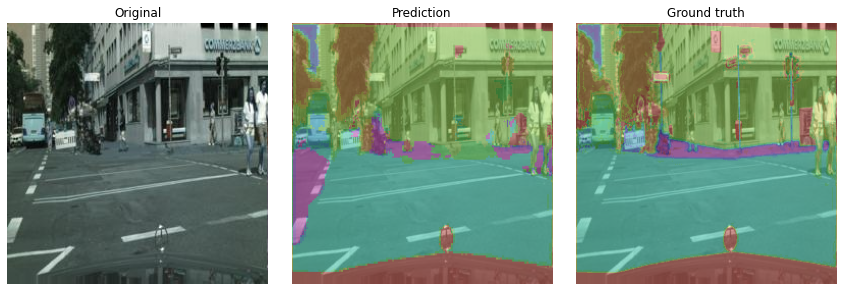

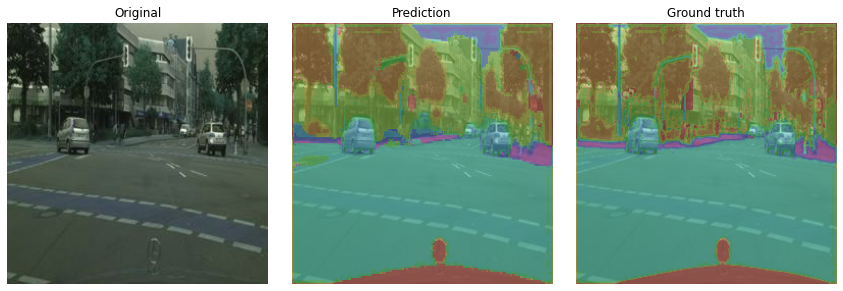

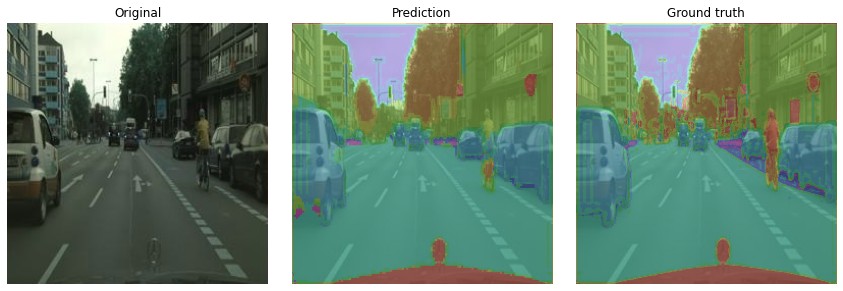

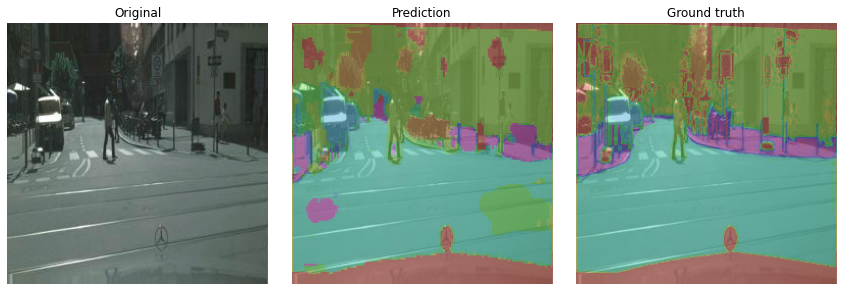

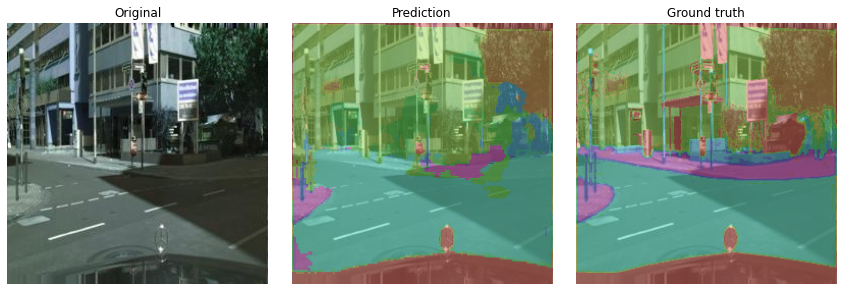

...

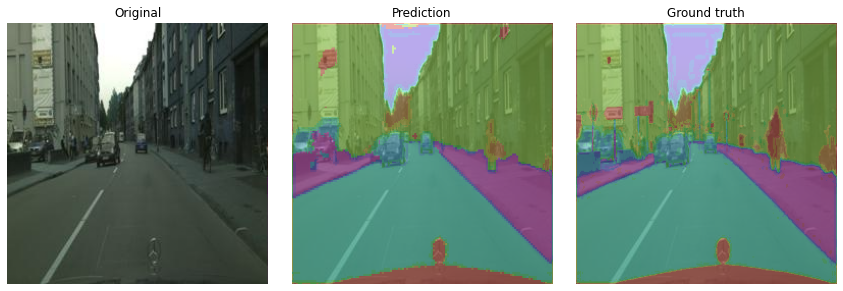

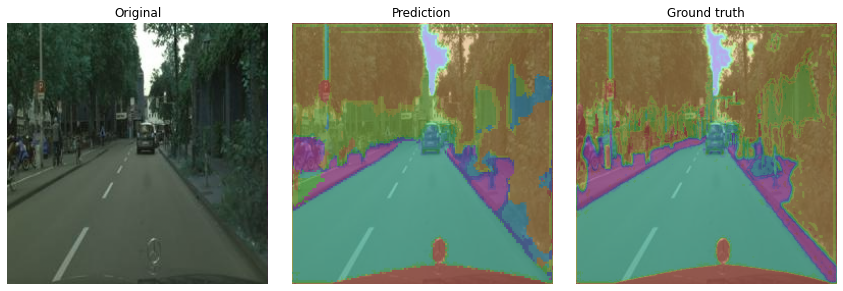

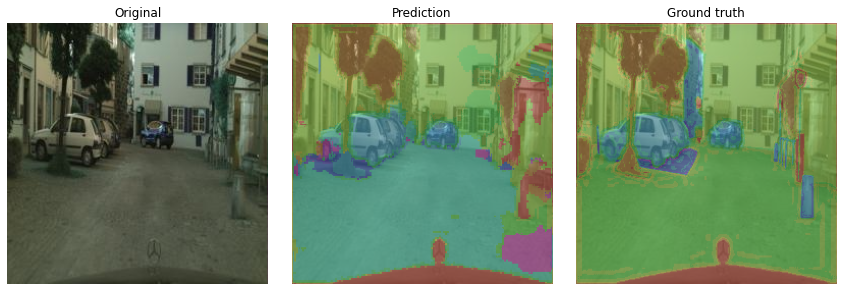

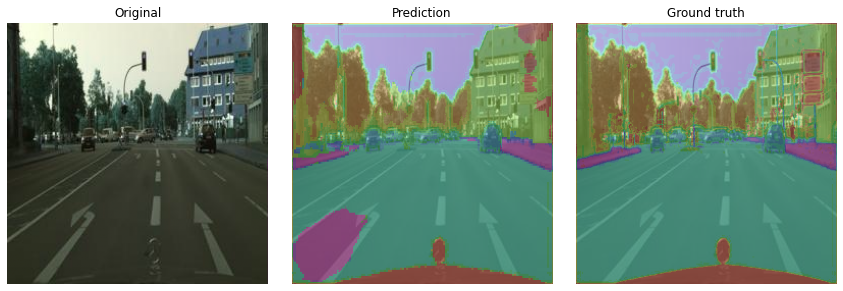

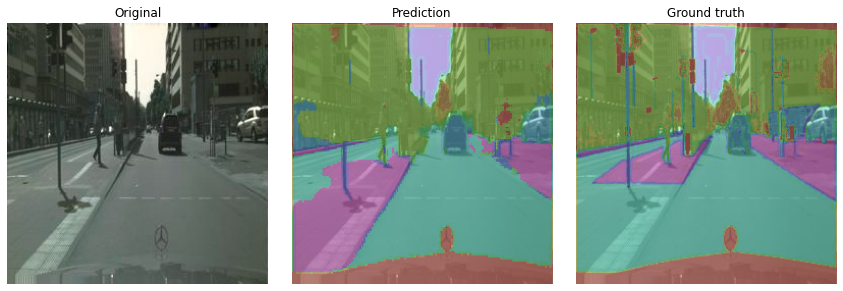

In [135]:
visualize_model(modeltest4)

# calling all of the functions for model 3

In [124]:
modelsel = 3

In [125]:
modeltest5 = create_model(modelsel)


Model: "Unet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
image_input (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_218 (Conv2D)             (None, 256, 256, 32) 896         image_input[0][0]                
__________________________________________________________________________________________________
batch_normalization_216 (BatchN (None, 256, 256, 32) 128         conv2d_218[0][0]                 
__________________________________________________________________________________________________
activation_36 (Activation)      (None, 256, 256, 32) 0           batch_normalization_216[0][0]    
_______________________________________________________________________________________________

In [126]:
saving_orig(modeltest5)

Saved model to disk


In [128]:
modeltest6= get_pruned(modeltest5)

C:\Users\hamoudi\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/30
185/185 [==============================] - 109s 496ms/step - loss: 0.5487 - accuracy: 0.8142 - val_loss: 0.7057 - val_accuracy: 0.7793
Epoch 2/30
185/185 [==============================] - 76s 411ms/step - loss: 0.5380 - accuracy: 0.8172 - val_loss: 0.7176 - val_accuracy: 0.7767
Epoch 3/30
185/185 [==============================] - 77s 414ms/step - loss: 0.5318 - accuracy: 0.8186 - val_loss: 0.7084 - val_accuracy: 0.7786
Epoch 4/30
185/185 [==============================] - 75s 404ms/step - loss: 0.5260 - accuracy: 0.8205 - val_loss: 0.7219 - val_accuracy: 0.7792
Epoch 5/30
185/185 [==============================] - 75s 403ms/step - loss: 0.5222 - accuracy: 0.8213 - val_loss: 0.7351 - val_accuracy: 0.7726
Epoch 6/30
185/185 [==============================] - 76s 410ms/step - loss: 0.5221 - accuracy: 0.8217 - val_loss: 0.8284 - val_accuracy: 0.7608
Epoch 7/30
185/185 [==============================] - 68s 365ms/step - loss: 0.5219 - accuracy: 0.8217 - val_loss: 0.7163 - val_a

In [129]:
modeltest6.summary()

Model: "Unet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
image_input (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
prune_low_magnitude_conv2d_218  (None, 256, 256, 32) 1762        image_input[0][0]                
__________________________________________________________________________________________________
prune_low_magnitude_batch_norma (None, 256, 256, 32) 129         prune_low_magnitude_conv2d_218[0]
__________________________________________________________________________________________________
prune_low_magnitude_activation_ (None, 256, 256, 32) 1           prune_low_magnitude_batch_normali
_______________________________________________________________________________________________

In [130]:
modeltest6=strip_pruning(modeltest6)

Epoch 1/30
185/185 [==============================] - 72s 377ms/step - loss: 0.5545 - accuracy: 0.8123 - mean_io_u_11: 0.4638 - val_loss: 0.8206 - val_accuracy: 0.7668 - val_mean_io_u_11: 0.5153
Epoch 2/30
185/185 [==============================] - 66s 356ms/step - loss: 0.5327 - accuracy: 0.8185 - mean_io_u_11: 0.4637 - val_loss: 0.7794 - val_accuracy: 0.7661 - val_mean_io_u_11: 0.4701
Epoch 3/30
185/185 [==============================] - 66s 355ms/step - loss: 0.5143 - accuracy: 0.8233 - mean_io_u_11: 0.4633 - val_loss: 0.7615 - val_accuracy: 0.7695 - val_mean_io_u_11: 0.4650
Epoch 4/30
185/185 [==============================] - 66s 356ms/step - loss: 0.4990 - accuracy: 0.8276 - mean_io_u_11: 0.4635 - val_loss: 0.7663 - val_accuracy: 0.7767 - val_mean_io_u_11: 0.4650
Epoch 5/30
185/185 [==============================] - 66s 356ms/step - loss: 0.5083 - accuracy: 0.8249 - mean_io_u_11: 0.4638 - val_loss: 0.8451 - val_accuracy: 0.7621 - val_mean_io_u_11: 0.4666
Epoch 6/30
185/185 [=====

In [131]:
modeltest6.summary()

Model: "Unet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
image_input (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_218 (Conv2D)             (None, 256, 256, 32) 896         image_input[0][0]                
__________________________________________________________________________________________________
batch_normalization_216 (BatchN (None, 256, 256, 32) 128         conv2d_218[1][0]                 
__________________________________________________________________________________________________
activation_36 (Activation)      (None, 256, 256, 32) 0           batch_normalization_216[1][0]    
_______________________________________________________________________________________________

In [132]:
saving_pruned(modeltest6)

Saved model to disk


In [133]:
#time for the third stripped and pruned model
timing_model(modeltest6)

Time:  0.6017889976501465


0.6017889976501465

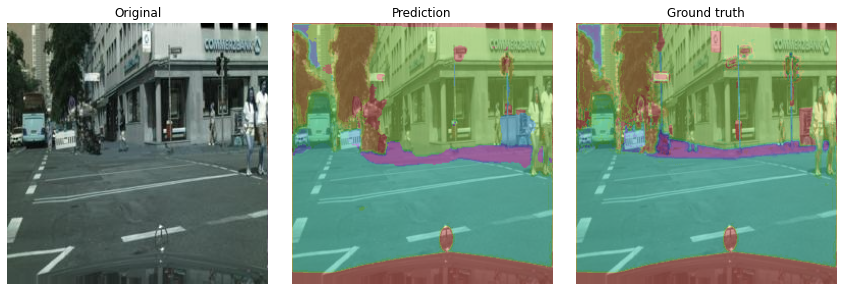

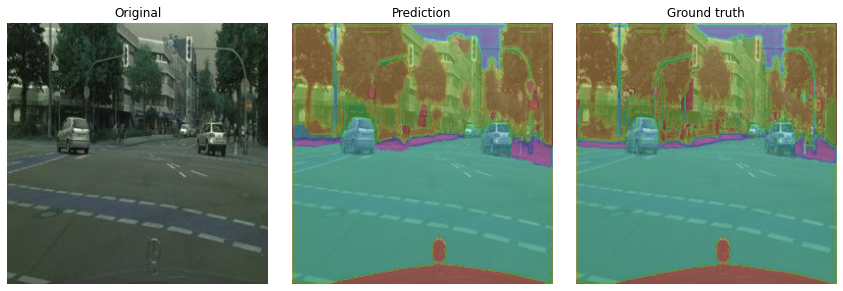

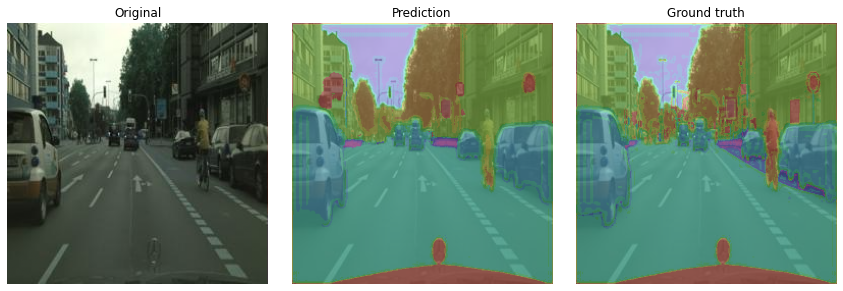

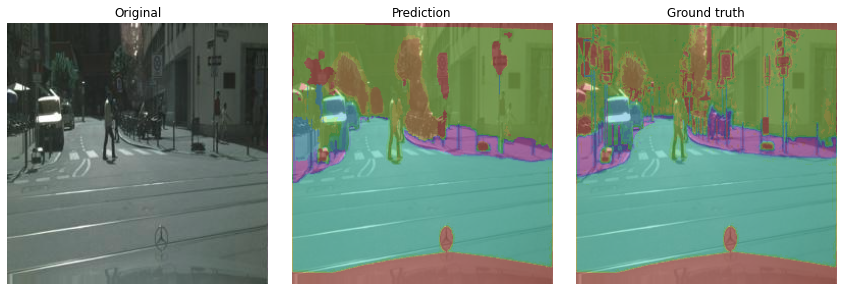

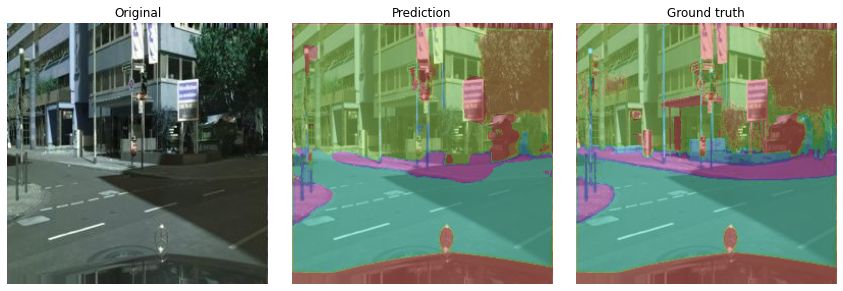

...

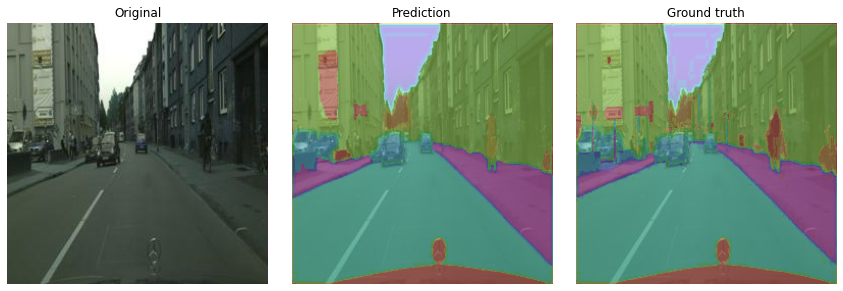

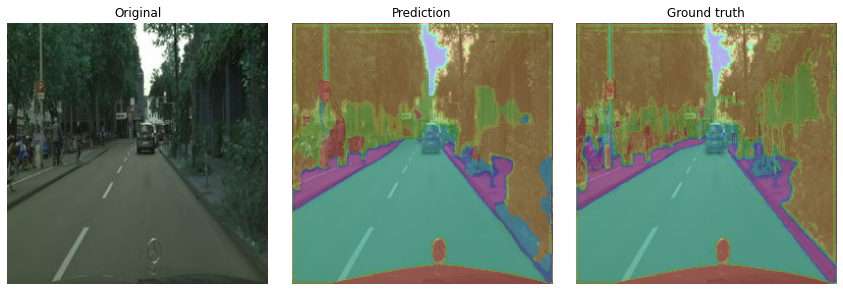

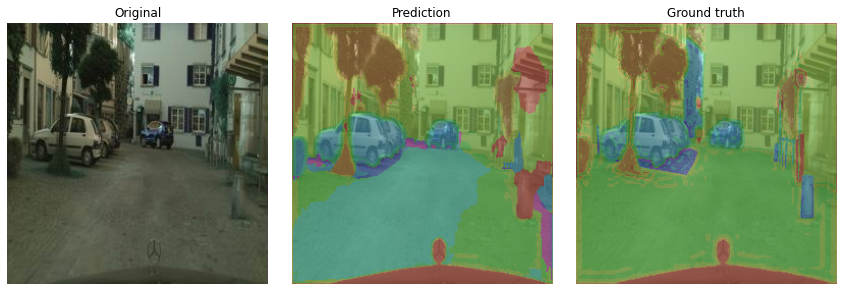

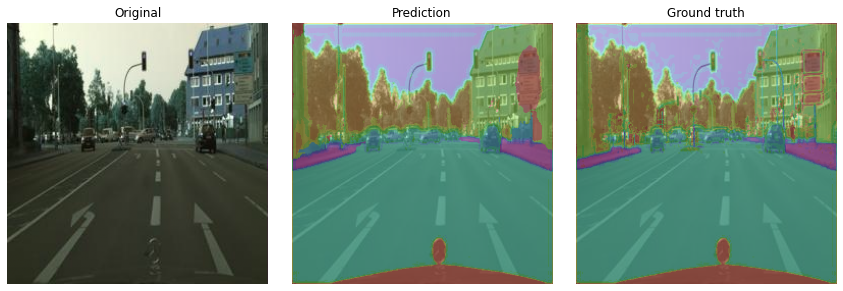

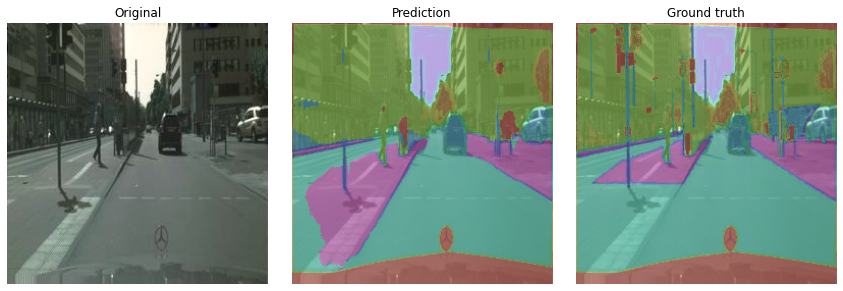

In [134]:
visualize_model(modeltest6)